# ML PROJECT 

## Data driven prediction models of energy use of appliances in a low-energy house

## Introduction to the Project

Data driven prediction models of energy use of appliances in a low-energy house.

In this project, we aim to develop data-driven models to predict the energy consumption of appliances in a low-energy house. With the global push towards energy efficiency and sustainability, understanding and optimizing energy use in residential settings has become increasingly important. Low-energy houses are designed to consume minimal energy, but even within such settings, there is potential for further efficiency by precisely forecasting and managing the energy demands of various household appliances.

Our approach leverages historical and real-time data from multiple sources, including indoor temperature, outdoor temperature, humidity, and occupancy, to accurately predict appliance energy consumption. By building predictive models, we can provide insights into patterns of energy use and identify opportunities for energy conservation. The project’s ultimate goal is to empower homeowners to make informed decisions about energy usage and potentially reduce their carbon footprint and energy costs.


Data-driven prediction models for energy use of appliances in low-energy houses are designed to improve energy efficiency by forecasting power consumption and optimizing energy usage patterns. These models utilize data from various sensors, including temperature, humidity, and occupancy, to predict appliance energy demand in real-time or for future intervals.



## Goal of the Project

The primary objective of this project is to develop an accurate prediction model for the energy consumption of household appliances in a low-energy residential setting. By accurately forecasting appliance energy use, this project aims to help homeowners and energy managers make informed decisions to reduce energy waste, optimize usage patterns, and achieve cost savings without compromising comfort or convenience.

### Main Objective

Predict Appliance Energy Consumption: Using historical and real-time data, the model will forecast the energy consumption of household appliances. This allows for better scheduling and usage management, as well as improved overall energy efficiency within the home.


### Key Metrics to Evaluate Performance

Mean Absolute Error (MAE): Measures the average magnitude of errors between predicted and actual energy consumption values, indicating how close the model predictions are to the true values.

Mean Squared Error (MSE): Provides a measure of error that penalizes larger discrepancies, useful for ensuring the model minimizes significant prediction errors.

Root Mean Squared Error (RMSE): Gives an idea of the model's prediction accuracy in the same units as the target variable, making it easy to interpret in the context of energy consumption.

R-squared (R²): Indicates how well the model explains the variability in energy consumption, providing an overall measure of model fit and robustness.

Mean Absolute Percentage Error (MAPE): Assesses the prediction accuracy relative to the true values, helping to understand how the error scales with different levels of energy consumption.

These metrics will guide the selection and tuning of the models, ensuring that the chosen approach achieves the best possible balance between accuracy and interpretability for practical, real-world use in low-energy households.



## Data Story

date time year-month-day hour:minute:second 
Appliances, energy use in Wh
lights, energy use of light fixtures in the house in Wh
T1, Temperature in kitchen area, in Celsius
RH_1, Humidity in kitchen area, in %
T2, Temperature in living room area, in Celsius
RH_2, Humidity in living room area, in %
T3, Temperature in laundry room area
RH_3, Humidity in laundry room area, in %
T4, Temperature in office room, in Celsius
RH_4, Humidity in office room, in %
T5, Temperature in bathroom, in Celsius
RH_5, Humidity in bathroom, in %
T6, Temperature outside the building (north side), in Celsius
RH_6, Humidity outside the building (north side), in %
T7, Temperature in ironing room , in Celsius
RH_7, Humidity in ironing room, in %
T8, Temperature in teenager room 2, in Celsius
RH_8, Humidity in teenager room 2, in %
T9, Temperature in parents room, in Celsius
RH_9, Humidity in parents room, in %
To, Temperature outside (from Chievres weather station), in Celsius
Pressure (from Chievres weather station), in mm Hg
RH_out, Humidity outside (from Chievres weather station), in %
Wind speed (from Chievres weather station), in m/s
Visibility (from Chievres weather station), in km
Tdewpoint (from Chievres weather station), Â°C
rv1, Random variable 1, nondimensional
rv2, Random variable 2, nondimensional

Where indicated, hourly data (then interpolated) from the nearest airport weather station (Chievres Airport, Belgium) was downloaded from a public data set from Reliable Prognosis, rp5.ru. Permission was obtained from Reliable Prognosis for the distribution of the 4.5 months of weather data.




## Importing Necessary Libraries


In [2]:
# Data Manipulation and Analysis

import pandas as pd           # For data manipulation and data frame operations
import numpy as np            # For numerical computations and array operations

# Data Visualization

import matplotlib.pyplot as plt   # For basic plotting and visualization
import seaborn as sns             # For statistical data visualization, based on Matplotlib

#Import necessary statistical libraries
import scipy.stats as stats    #General-purpose statistical tools, probability distributions, and hypothesis tests.
import statsmodels.api as sm   #Comprehensive statistical modeling (regression, time series, GLMs), with emphasis on model fitting and statistical testing.
from scipy.stats import norm   #A specialized normal distribution object from scipy.stats, useful for calculations specific to the normal distribution.


#These libraries are commonly used together in data science for exploring data, running tests, 
#building statistical models, and analyzing model results.

# Machine Learning

from sklearn.model_selection import train_test_split     # For splitting data into train and test sets
from sklearn.linear_model import LinearRegression        # For linear regression models
from sklearn.ensemble import RandomForestRegressor       # For random forest regression models
from sklearn.metrics import mean_squared_error, r2_score # For evaluating model performance
from sklearn.preprocessing import StandardScaler         # For scaling data before model training

# Ignore warning

import warnings 
warnings.filterwarnings("ignore")




# Data set first view

## Importing the Data


In [4]:

df=pd.read_csv("C:\\Users\\rajan\\Downloads\\appliances+energy+prediction (1)\\energydata_complete.csv")


In [5]:
df

,date,Appliances,lights,T1,RH_1,T2,RH_2,T3,RH_3,T4,...,T9,RH_9,T_out,Press_mm_hg,RH_out,Windspeed,Visibility,Tdewpoint,rv1,rv2
0,2016-01-11 17:00:00,60,30,19.890000,47.596667,19.200000,44.790000,19.790000,44.730000,19.000000,...,17.033333,45.5300,6.600000,733.5,92.000000,7.000000,63.000000,5.300000,13.275433,13.275433
1,2016-01-11 17:10:00,60,30,19.890000,46.693333,19.200000,44.722500,19.790000,44.790000,19.000000,...,17.066667,45.5600,6.483333,733.6,92.000000,6.666667,59.166667,5.200000,18.606195,18.606195
2,2016-01-11 17:20:00,50,30,19.890000,46.300000,19.200000,44.626667,19.790000,44.933333,18.926667,...,17.000000,45.5000,6.366667,733.7,92.000000,6.333333,55.333333,5.100000,28.642668,28.642668
3,2016-01-11 17:30:00,50,40,19.890000,46.066667,19.200000,44.590000,19.790000,45.000000,18.890000,...,17.000000,45.4000,6.250000,733.8,92.000000,6.000000,51.500000,5.000000,45.410389,45.410389
4,2016-01-11 17:40:00,60,40,19.890000,46.333333,19.200000,44.530000,19.790000,45.000000,18.890000,...,17.000000,45.4000,6.133333,733.9,92.000000,5.666667,47.666667,4.900000,10.084097,10.084097
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19730,2016-05-27 17:20:00,100,0,25.566667,46.560000,25.890000,42.025714,27.200000,41.163333,24.700000,...,23.200000,46.7900,22.733333,755.2,55.666667,3.333333,23.666667,13.333333,43.096812,43.096812
19731,2016-05-27 17:30:00,90,0,25.500000,46.500000,25.754000,42.080000,27.133333,41.223333,24.700000,...,23.200000,46.7900,22.600000,755.2,56.000000,3.500000,24.500000,13.300000,49.282940,49.282940
19732,2016-05-27 17:40:00,270,10,25.500000,46.596667,25.628571,42.768571,27.050000,41.690000,24.700000,...,23.200000,46.7900,22.466667,755.2,56.333333,3.666667,25.333333,13.266667,29.199117,29.199117
19733,2016-05-27 17:50:00,420,10,25.500000,46.990000,25.414000,43.036000,26.890000,41.290000,24.700000,...,23.200000,46.8175,22.333333,755.2,56.666667,3.833333,26.166667,13.233333,6.322784,6.322784


## Know Your Data


In [ ]:
df.info()

In [ ]:
df.head()

In [ ]:
df.tail()

## Dataset raw and column count

In [ ]:
df.shape

### Shape of the data frame is (19735*29) rows =19735 columns=29


In [6]:
df.describe() # Display the statistical information

,Appliances,lights,T1,RH_1,T2,RH_2,T3,RH_3,T4,RH_4,...,T9,RH_9,T_out,Press_mm_hg,RH_out,Windspeed,Visibility,Tdewpoint,rv1,rv2
count,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,...,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000
mean,97.694958,3.801875,21.686571,40.259739,20.341219,40.420420,22.267611,39.242500,20.855335,39.026904,...,19.485828,41.552401,7.411665,755.522602,79.750418,4.039752,38.330834,3.760707,24.988033,24.988033
std,102.524891,7.935988,1.606066,3.979299,2.192974,4.069813,2.006111,3.254576,2.042884,4.341321,...,2.014712,4.151497,5.317409,7.399441,14.901088,2.451221,11.794719,4.194648,14.496634,14.496634
min,10.000000,0.000000,16.790000,27.023333,16.100000,20.463333,17.200000,28.766667,15.100000,27.660000,...,14.890000,29.166667,-5.000000,729.300000,24.000000,0.000000,1.000000,-6.600000,0.005322,0.005322
25%,50.000000,0.000000,20.760000,37.333333,18.790000,37.900000,20.790000,36.900000,19.530000,35.530000,...,18.000000,38.500000,3.666667,750.933333,70.333333,2.000000,29.000000,0.900000,12.497889,12.497889
50%,60.000000,0.000000,21.600000,39.656667,20.000000,40.500000,22.100000,38.530000,20.666667,38.400000,...,19.390000,40.900000,6.916667,756.100000,83.666667,3.666667,40.000000,3.433333,24.897653,24.897653
75%,100.000000,0.000000,22.600000,43.066667,21.500000,43.260000,23.290000,41.760000,22.100000,42.156667,...,20.600000,44.338095,10.408333,760.933333,91.666667,5.500000,40.000000,6.566667,37.583769,37.583769
max,1080.000000,70.000000,26.260000,63.360000,29.856667,56.026667,29.236000,50.163333,26.200000,51.090000,...,24.500000,53.326667,26.100000,772.300000,100.000000,14.000000,66.000000,15.500000,49.996530,49.996530


### Check for Null Values

In [7]:
df.isnull().sum()

date           0
Appliances     0
lights         0
T1             0
RH_1           0
T2             0
RH_2           0
T3             0
RH_3           0
T4             0
RH_4           0
T5             0
RH_5           0
T6             0
RH_6           0
T7             0
RH_7           0
T8             0
RH_8           0
T9             0
RH_9           0
T_out          0
Press_mm_hg    0
RH_out         0
Windspeed      0
Visibility     0
Tdewpoint      0
rv1            0
rv2            0
dtype: int64

### Finding the percentage of null values 

In [8]:
total_no_of_raws=df.shape[0]  # get total number of rows
missing_value_count=df.isnull().sum() # get total number of missing values
missing_value_in_percentage=missing_value_count/total_no_of_raws*100 # get missing values in percentage
missing_value_in_percentage

date           0.0
Appliances     0.0
lights         0.0
T1             0.0
RH_1           0.0
T2             0.0
RH_2           0.0
T3             0.0
RH_3           0.0
T4             0.0
RH_4           0.0
T5             0.0
RH_5           0.0
T6             0.0
RH_6           0.0
T7             0.0
RH_7           0.0
T8             0.0
RH_8           0.0
T9             0.0
RH_9           0.0
T_out          0.0
Press_mm_hg    0.0
RH_out         0.0
Windspeed      0.0
Visibility     0.0
Tdewpoint      0.0
rv1            0.0
rv2            0.0
dtype: float64

In [9]:
### There is no null values present in the dataset
### Vizalising the missing values 

<Figure size 1000x1000 with 0 Axes>

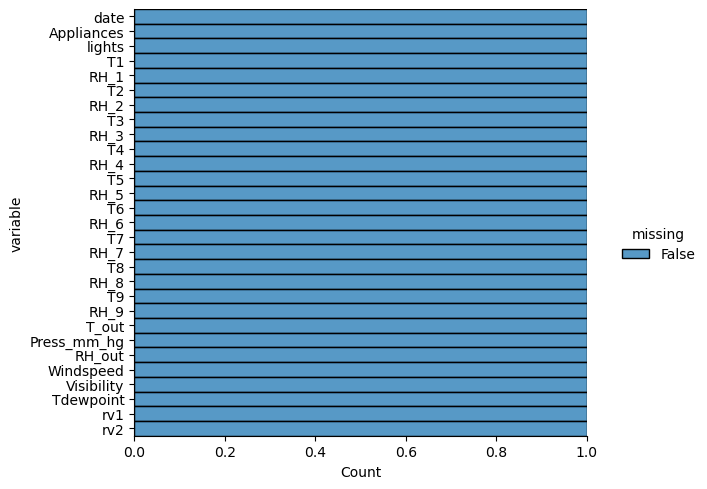

In [10]:
plt.figure(figsize=(10,10))
sns.displot(
    data=df.isna().melt(value_name="missing"),
    y="variable",
    hue="missing",
    multiple="fill",
    aspect=1.25
)
plt.savefig("visualizing_missing_data_with_barplot_Seaborn_distplot.png", dpi=100)


In [11]:
# check garbage values (unique value and its frequency)
for column in df.select_dtypes(include="object").columns:
    print(f"{df[column].value_counts()}\n")

date
2016-01-11 17:00:00    1
2016-04-12 01:30:00    1
2016-04-12 02:40:00    1
2016-04-12 02:30:00    1
2016-04-12 02:20:00    1
                      ..
2016-02-26 09:10:00    1
2016-02-26 09:00:00    1
2016-02-26 08:50:00    1
2016-02-26 08:40:00    1
2016-05-27 18:00:00    1
Name: count, Length: 19735, dtype: int64



# What did you know about your dataset?

The dataset provided contains 29 columns and 19735 rows and does not have any missing or duplicate values.

The goal is to predict the energy use of appliances. Demand prediction involves analytical studies on the probability of house temperature and humidity conditions, which were monitored with a ZigBee wireless sensor network for 10 minutes for about 4.5 months.

There is no duplicate columns

There is no missing values

There is no garbage values.


### Handling Duplicates raw if it occures


In [89]:
df.drop_duplicates(inplace=True) # drop duplicates and update df
df.duplicated().sum() # show duplicate count

0

#### No Duplicates raw find


### check unique values


# Understanding Your Variables

In [12]:
df.columns

Index(['date', 'Appliances', 'lights', 'T1', 'RH_1', 'T2', 'RH_2', 'T3',
       'RH_3', 'T4', 'RH_4', 'T5', 'RH_5', 'T6', 'RH_6', 'T7', 'RH_7', 'T8',
       'RH_8', 'T9', 'RH_9', 'T_out', 'Press_mm_hg', 'RH_out', 'Windspeed',
       'Visibility', 'Tdewpoint', 'rv1', 'rv2'],
      dtype='object')

In [13]:
df.describe()

,Appliances,lights,T1,RH_1,T2,RH_2,T3,RH_3,T4,RH_4,...,T9,RH_9,T_out,Press_mm_hg,RH_out,Windspeed,Visibility,Tdewpoint,rv1,rv2
count,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,...,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000
mean,97.694958,3.801875,21.686571,40.259739,20.341219,40.420420,22.267611,39.242500,20.855335,39.026904,...,19.485828,41.552401,7.411665,755.522602,79.750418,4.039752,38.330834,3.760707,24.988033,24.988033
std,102.524891,7.935988,1.606066,3.979299,2.192974,4.069813,2.006111,3.254576,2.042884,4.341321,...,2.014712,4.151497,5.317409,7.399441,14.901088,2.451221,11.794719,4.194648,14.496634,14.496634
min,10.000000,0.000000,16.790000,27.023333,16.100000,20.463333,17.200000,28.766667,15.100000,27.660000,...,14.890000,29.166667,-5.000000,729.300000,24.000000,0.000000,1.000000,-6.600000,0.005322,0.005322
25%,50.000000,0.000000,20.760000,37.333333,18.790000,37.900000,20.790000,36.900000,19.530000,35.530000,...,18.000000,38.500000,3.666667,750.933333,70.333333,2.000000,29.000000,0.900000,12.497889,12.497889
50%,60.000000,0.000000,21.600000,39.656667,20.000000,40.500000,22.100000,38.530000,20.666667,38.400000,...,19.390000,40.900000,6.916667,756.100000,83.666667,3.666667,40.000000,3.433333,24.897653,24.897653
75%,100.000000,0.000000,22.600000,43.066667,21.500000,43.260000,23.290000,41.760000,22.100000,42.156667,...,20.600000,44.338095,10.408333,760.933333,91.666667,5.500000,40.000000,6.566667,37.583769,37.583769
max,1080.000000,70.000000,26.260000,63.360000,29.856667,56.026667,29.236000,50.163333,26.200000,51.090000,...,24.500000,53.326667,26.100000,772.300000,100.000000,14.000000,66.000000,15.500000,49.996530,49.996530


In [ ]:
# Checking unique values

In [14]:
# Check Unique Values for each variable.
def get_unqiuevalues(df1):
    unique_values=df1.apply(pd.Series.unique)
    return unique_values

unq_values = get_unqiuevalues(df)

# Check Unique Values for each variable.
for i in df.columns.tolist():
  print("No. of unique values in ",i,"is",df[i].nunique()) # nunique gives total count


No. of unique values in  date is 19735
No. of unique values in  Appliances is 92
No. of unique values in  lights is 8
No. of unique values in  T1 is 722
No. of unique values in  RH_1 is 2547
No. of unique values in  T2 is 1650
No. of unique values in  RH_2 is 3376
No. of unique values in  T3 is 1426
No. of unique values in  RH_3 is 2618
No. of unique values in  T4 is 1390
No. of unique values in  RH_4 is 2987
No. of unique values in  T5 is 2263
No. of unique values in  RH_5 is 7571
No. of unique values in  T6 is 4446
No. of unique values in  RH_6 is 9709
No. of unique values in  T7 is 1955
No. of unique values in  RH_7 is 5891
No. of unique values in  T8 is 2228
No. of unique values in  RH_8 is 6649
No. of unique values in  T9 is 924
No. of unique values in  RH_9 is 3388
No. of unique values in  T_out is 1730
No. of unique values in  Press_mm_hg is 2189
No. of unique values in  RH_out is 566
No. of unique values in  Windspeed is 189
No. of unique values in  Visibility is 413
No. of uni

## Additional Variable Information

date time year-month-day hour:minute:second 
Appliances, energy use in Wh
lights, energy use of light fixtures in the house in Wh
T1, Temperature in kitchen area, in Celsius
RH_1, Humidity in kitchen area, in %
T2, Temperature in living room area, in Celsius
RH_2, Humidity in living room area, in %
T3, Temperature in laundry room area
RH_3, Humidity in laundry room area, in %
T4, Temperature in office room, in Celsius
RH_4, Humidity in office room, in %
T5, Temperature in bathroom, in Celsius
RH_5, Humidity in bathroom, in %
T6, Temperature outside the building (north side), in Celsius
RH_6, Humidity outside the building (north side), in %
T7, Temperature in ironing room , in Celsius
RH_7, Humidity in ironing room, in %
T8, Temperature in teenager room 2, in Celsius
RH_8, Humidity in teenager room 2, in %
T9, Temperature in parents room, in Celsius
RH_9, Humidity in parents room, in %
To, Temperature outside (from Chievres weather station), in Celsius
Pressure (from Chievres weather station), in mm Hg
RH_out, Humidity outside (from Chievres weather station), in %
Wind speed (from Chievres weather station), in m/s
Visibility (from Chievres weather station), in km
Tdewpoint (from Chievres weather station), Â°C
rv1, Random variable 1, nondimensional
rv2, Random variable 2, nondimensional

Where indicated, hourly data (then interpolated) from the nearest airport weather station .

### Data Wrangling
Data wrangling (also known as data cleaning or data preprocessing) is the process of transforming raw data into a clean and usable format for analysis. It involves various steps to address issues within the dataset, making it ready for modeling and interpretation.

In [15]:
# Taking the copy of data set to other data frame

df_energy= df.copy()
df_energy.head()

,date,Appliances,lights,T1,RH_1,T2,RH_2,T3,RH_3,T4,...,T9,RH_9,T_out,Press_mm_hg,RH_out,Windspeed,Visibility,Tdewpoint,rv1,rv2
0,2016-01-11 17:00:00,60,30,19.89,47.596667,19.2,44.790000,19.79,44.730000,19.000000,...,17.033333,45.53,6.600000,733.5,92.0,7.000000,63.000000,5.3,13.275433,13.275433
1,2016-01-11 17:10:00,60,30,19.89,46.693333,19.2,44.722500,19.79,44.790000,19.000000,...,17.066667,45.56,6.483333,733.6,92.0,6.666667,59.166667,5.2,18.606195,18.606195
2,2016-01-11 17:20:00,50,30,19.89,46.300000,19.2,44.626667,19.79,44.933333,18.926667,...,17.000000,45.50,6.366667,733.7,92.0,6.333333,55.333333,5.1,28.642668,28.642668
3,2016-01-11 17:30:00,50,40,19.89,46.066667,19.2,44.590000,19.79,45.000000,18.890000,...,17.000000,45.40,6.250000,733.8,92.0,6.000000,51.500000,5.0,45.410389,45.410389
4,2016-01-11 17:40:00,60,40,19.89,46.333333,19.2,44.530000,19.79,45.000000,18.890000,...,17.000000,45.40,6.133333,733.9,92.0,5.666667,47.666667,4.9,10.084097,10.084097


In [16]:
# rename the columns for more undersatnding 

df_energy.rename(columns={'T1': 'temp_kitchen', 'RH_1':'hu_Kitchen', 'T2':'temp_living_room', 'RH_2': 'hu_living', 'T3':'temp_Laundry_room',
       'RH_3':'hu_laundry', 'T4':'temp_office_room', 'RH_4':'hu_office', 'T5':'temp_bathroom', 'RH_5':'hu_bath', 'T6':'temp_build_out'
       , 'RH_6':'hu_build_out', 'T7':'temp_ironing_room', 'RH_7':'hu_ironing_room', 'T8':'temp_teen_room',
       'RH_8':'hu_teen', 'T9':'temp_parents_room', 'RH_9':'hu_parent', 'T_out':'temp_out', 'RH_out':'out_humidity'},inplace= True )
df_energy.head()

,date,Appliances,lights,temp_kitchen,hu_Kitchen,temp_living_room,hu_living,temp_Laundry_room,hu_laundry,temp_office_room,...,temp_parents_room,hu_parent,temp_out,Press_mm_hg,out_humidity,Windspeed,Visibility,Tdewpoint,rv1,rv2
0,2016-01-11 17:00:00,60,30,19.89,47.596667,19.2,44.790000,19.79,44.730000,19.000000,...,17.033333,45.53,6.600000,733.5,92.0,7.000000,63.000000,5.3,13.275433,13.275433
1,2016-01-11 17:10:00,60,30,19.89,46.693333,19.2,44.722500,19.79,44.790000,19.000000,...,17.066667,45.56,6.483333,733.6,92.0,6.666667,59.166667,5.2,18.606195,18.606195
2,2016-01-11 17:20:00,50,30,19.89,46.300000,19.2,44.626667,19.79,44.933333,18.926667,...,17.000000,45.50,6.366667,733.7,92.0,6.333333,55.333333,5.1,28.642668,28.642668
3,2016-01-11 17:30:00,50,40,19.89,46.066667,19.2,44.590000,19.79,45.000000,18.890000,...,17.000000,45.40,6.250000,733.8,92.0,6.000000,51.500000,5.0,45.410389,45.410389
4,2016-01-11 17:40:00,60,40,19.89,46.333333,19.2,44.530000,19.79,45.000000,18.890000,...,17.000000,45.40,6.133333,733.9,92.0,5.666667,47.666667,4.9,10.084097,10.084097


In [17]:
df_energy.describe()

,Appliances,lights,temp_kitchen,hu_Kitchen,temp_living_room,hu_living,temp_Laundry_room,hu_laundry,temp_office_room,hu_office,...,temp_parents_room,hu_parent,temp_out,Press_mm_hg,out_humidity,Windspeed,Visibility,Tdewpoint,rv1,rv2
count,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,...,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000
mean,97.694958,3.801875,21.686571,40.259739,20.341219,40.420420,22.267611,39.242500,20.855335,39.026904,...,19.485828,41.552401,7.411665,755.522602,79.750418,4.039752,38.330834,3.760707,24.988033,24.988033
std,102.524891,7.935988,1.606066,3.979299,2.192974,4.069813,2.006111,3.254576,2.042884,4.341321,...,2.014712,4.151497,5.317409,7.399441,14.901088,2.451221,11.794719,4.194648,14.496634,14.496634
min,10.000000,0.000000,16.790000,27.023333,16.100000,20.463333,17.200000,28.766667,15.100000,27.660000,...,14.890000,29.166667,-5.000000,729.300000,24.000000,0.000000,1.000000,-6.600000,0.005322,0.005322
25%,50.000000,0.000000,20.760000,37.333333,18.790000,37.900000,20.790000,36.900000,19.530000,35.530000,...,18.000000,38.500000,3.666667,750.933333,70.333333,2.000000,29.000000,0.900000,12.497889,12.497889
50%,60.000000,0.000000,21.600000,39.656667,20.000000,40.500000,22.100000,38.530000,20.666667,38.400000,...,19.390000,40.900000,6.916667,756.100000,83.666667,3.666667,40.000000,3.433333,24.897653,24.897653
75%,100.000000,0.000000,22.600000,43.066667,21.500000,43.260000,23.290000,41.760000,22.100000,42.156667,...,20.600000,44.338095,10.408333,760.933333,91.666667,5.500000,40.000000,6.566667,37.583769,37.583769
max,1080.000000,70.000000,26.260000,63.360000,29.856667,56.026667,29.236000,50.163333,26.200000,51.090000,...,24.500000,53.326667,26.100000,772.300000,100.000000,14.000000,66.000000,15.500000,49.996530,49.996530


In [18]:
df_energy.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 19735 entries, 0 to 19734
Data columns (total 29 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   date               19735 non-null  object 
 1   Appliances         19735 non-null  int64  
 2   lights             19735 non-null  int64  
 3   temp_kitchen       19735 non-null  float64
 4   hu_Kitchen         19735 non-null  float64
 5   temp_living_room   19735 non-null  float64
 6   hu_living          19735 non-null  float64
 7   temp_Laundry_room  19735 non-null  float64
 8   hu_laundry         19735 non-null  float64
 9   temp_office_room   19735 non-null  float64
 10  hu_office          19735 non-null  float64
 11  temp_bathroom      19735 non-null  float64
 12  hu_bath            19735 non-null  float64
 13  temp_build_out     19735 non-null  float64
 14  hu_build_out       19735 non-null  float64
 15  temp_ironing_room  19735 non-null  float64
 16  hu_ironing_room    197

In [19]:
# Assuming your dataframe has a 'timestamp' column
# To generate a sample dataframe for demonstration:


# Convert the 'timestamp' column to datetime
df_energy['date']=pd.to_datetime(df_energy['date'])

#Getting the months and days from date

df_energy['month'] = df_energy['date'].dt.month
df_energy['weekday'] = df_energy['date'].dt.weekday
df_energy['hour'] = df_energy['date'].dt.hour

#drop the date column
df_energy.drop('date',axis=1,inplace=True)


# Print the updated dataframe
df_energy.head()
     

,Appliances,lights,temp_kitchen,hu_Kitchen,temp_living_room,hu_living,temp_Laundry_room,hu_laundry,temp_office_room,hu_office,...,Press_mm_hg,out_humidity,Windspeed,Visibility,Tdewpoint,rv1,rv2,month,weekday,hour
0,60,30,19.89,47.596667,19.2,44.790000,19.79,44.730000,19.000000,45.566667,...,733.5,92.0,7.000000,63.000000,5.3,13.275433,13.275433,1,0,17
1,60,30,19.89,46.693333,19.2,44.722500,19.79,44.790000,19.000000,45.992500,...,733.6,92.0,6.666667,59.166667,5.2,18.606195,18.606195,1,0,17
2,50,30,19.89,46.300000,19.2,44.626667,19.79,44.933333,18.926667,45.890000,...,733.7,92.0,6.333333,55.333333,5.1,28.642668,28.642668,1,0,17
3,50,40,19.89,46.066667,19.2,44.590000,19.79,45.000000,18.890000,45.723333,...,733.8,92.0,6.000000,51.500000,5.0,45.410389,45.410389,1,0,17
4,60,40,19.89,46.333333,19.2,44.530000,19.79,45.000000,18.890000,45.530000,...,733.9,92.0,5.666667,47.666667,4.9,10.084097,10.084097,1,0,17


In [20]:
df_energy.columns

Index(['Appliances', 'lights', 'temp_kitchen', 'hu_Kitchen',
       'temp_living_room', 'hu_living', 'temp_Laundry_room', 'hu_laundry',
       'temp_office_room', 'hu_office', 'temp_bathroom', 'hu_bath',
       'temp_build_out', 'hu_build_out', 'temp_ironing_room',
       'hu_ironing_room', 'temp_teen_room', 'hu_teen', 'temp_parents_room',
       'hu_parent', 'temp_out', 'Press_mm_hg', 'out_humidity', 'Windspeed',
       'Visibility', 'Tdewpoint', 'rv1', 'rv2', 'month', 'weekday', 'hour'],
      dtype='object')

In [21]:
#separate column list for better analysis
temp_cols=['temp_kitchen','temp_living_room','temp_Laundry_room','temp_office_room','temp_bathroom','temp_build_out','temp_ironing_room','temp_teen_room','temp_parents_room']
hu_cols=['hu_Kitchen','hu_living','hu_laundry', 'hu_office','hu_bath','hu_build_out','hu_ironing_room','hu_teen','hu_parent']
light_cols=['light']
weather_cols=['temp_out','out_humidity',"Tdewpoint","Press_mm_hg","Windspeed","Visibility"]
date_col = ['month','weekday','hour']
random_col = ["rv1","rv2"]



### Manipulations done

Splitting date columns into hour,weekdays, months.
It will help in analysing the data on the bases of months, days and hours.
Dropped date column due to no further use of them.
Renaming of some features, for better understanding and readability

### Data Vizualization

Understaning the relationships between variables



<Axes: xlabel='Appliances', ylabel='Density'>

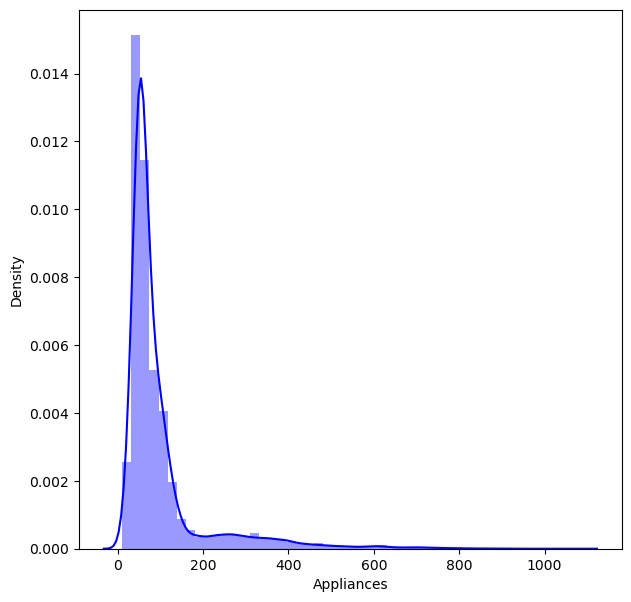

In [22]:
# Chart - 1 visualization code
#Dependent varaible "Appliance"
plt.figure(figsize=(7,7))
sns.distplot(df_energy['Appliances'], color = 'Blue')

1. Why did you pick the specific chart?
distplot is to check the distrubtion of the dependent variable "Appliances"

2. What is/are the insight(s) found from the chart?

The dependent varaible "appliances" has postive skweness that data is more likely distributed in the right hand side of the mean

we need to the deal with skewness by applying log tansfromation to get the skewness in to noraml disturbtion to anlaze the data

### Skewness Treatment for variable appliances 

Log Transformation: Useful when there’s a large positive skew.

In [27]:
df_energy['Appliances'] = np.log1p(df_energy['Appliances'])  # log1p handles zeros well (log(1 + x))


<Axes: xlabel='Appliances', ylabel='Density'>

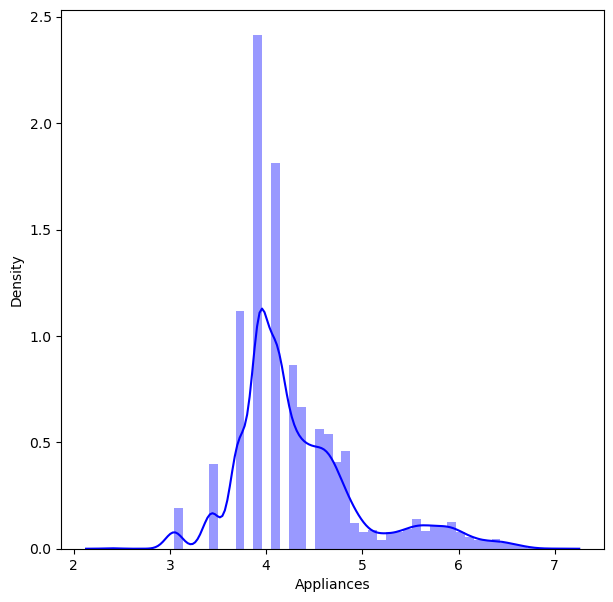

In [28]:
# Chart - 2 visualization code
#Dependent varaible "Appliance" after Skewness log mode Treatment for variable appliances 

plt.figure(figsize=(7,7))
sns.distplot(df_energy['Appliances'], color = 'Blue')

#### Temperature Columns (UniVarit+Bivariate)


#### Now the data is normally distrubted that is many assumption of the varable to analyze the data or applying the linear regression model

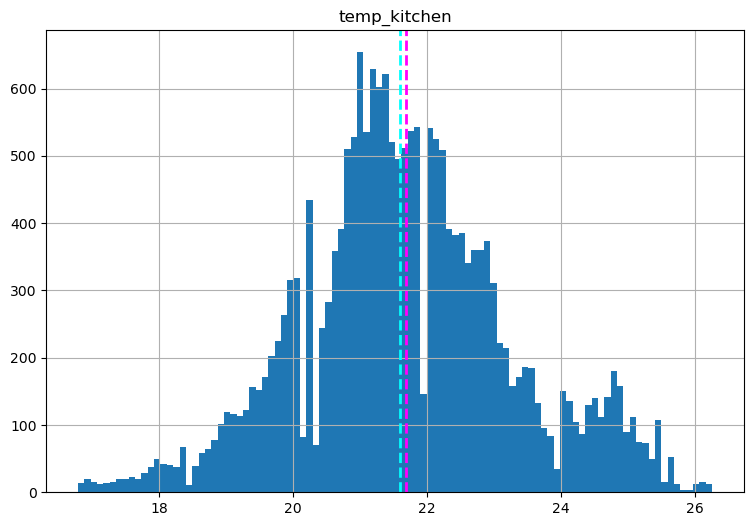

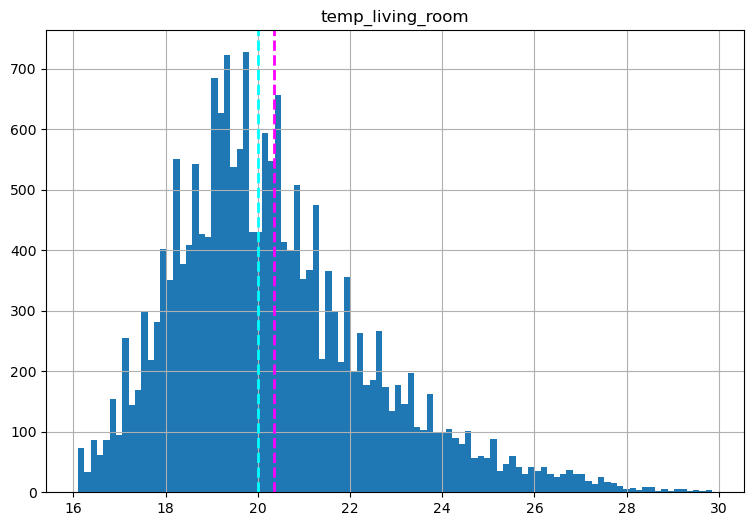

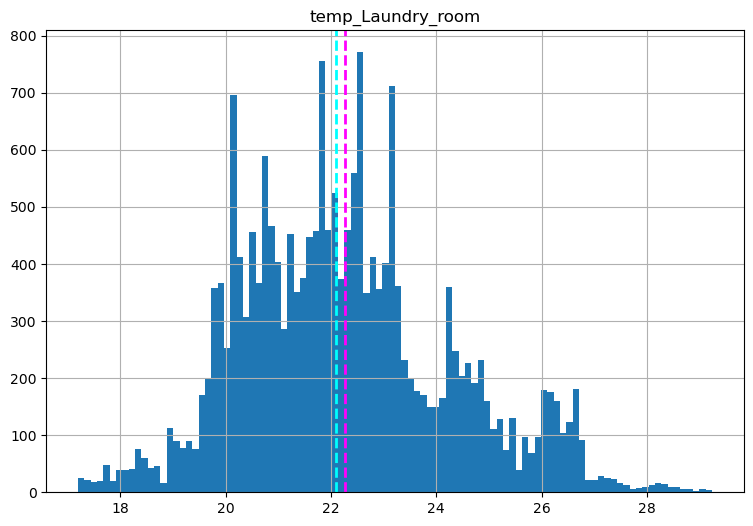

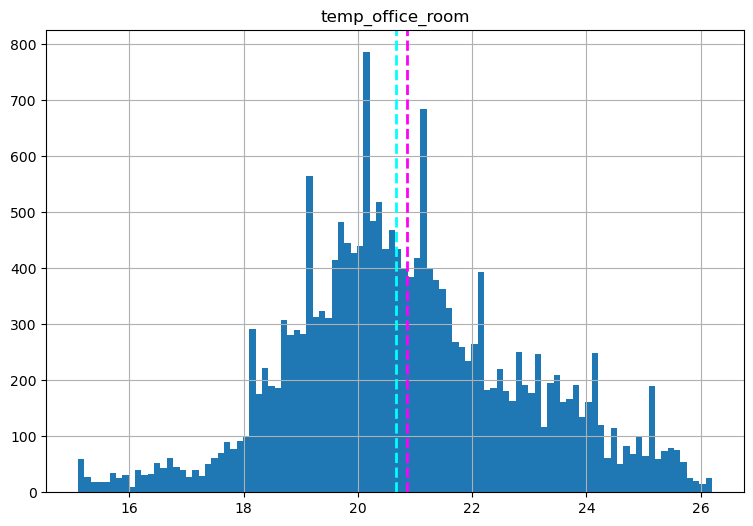

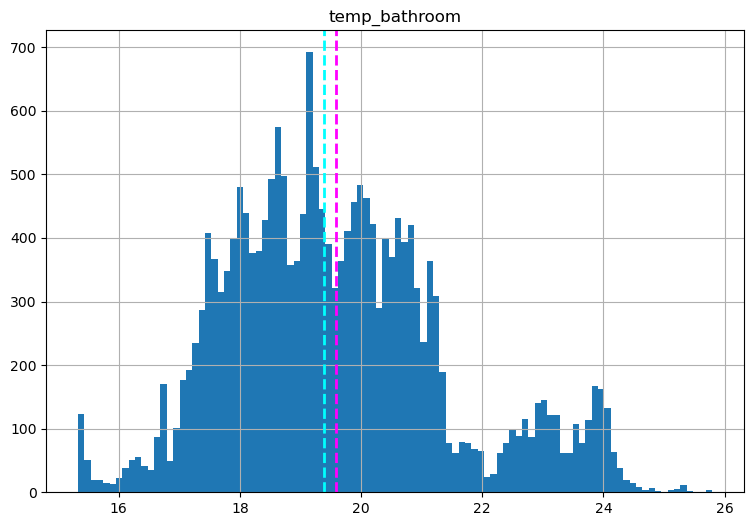

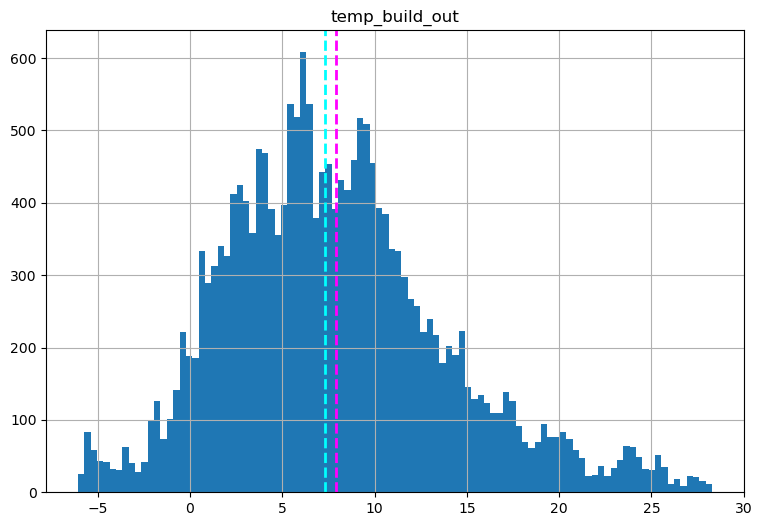

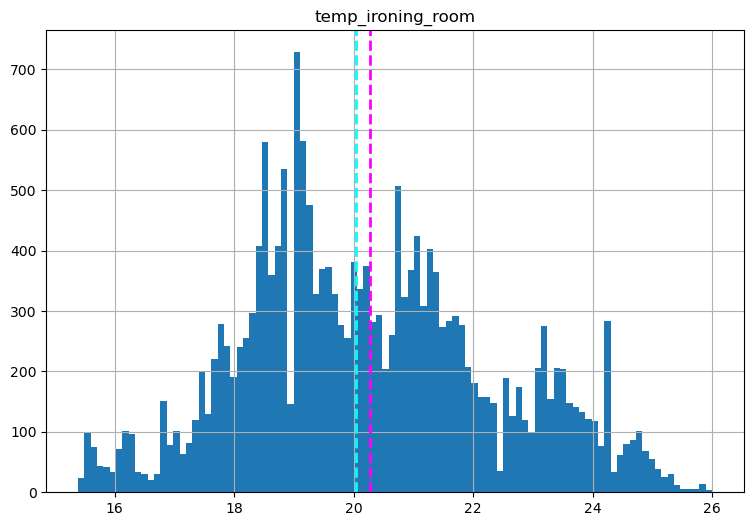

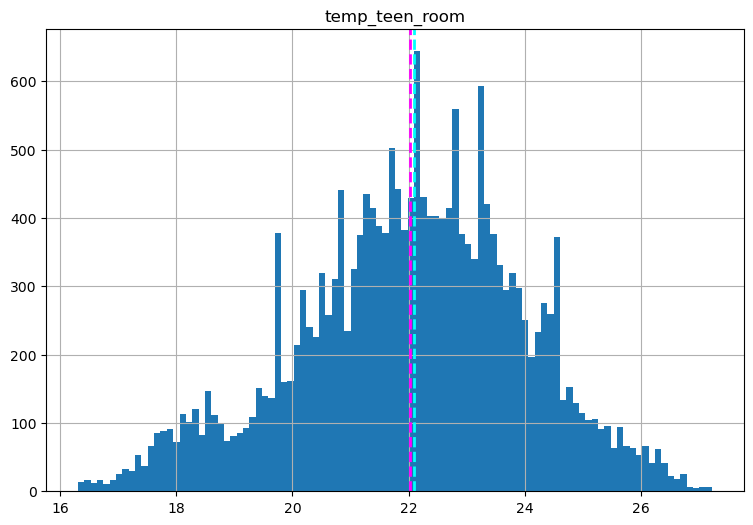

In [168]:
# Chart - 3 visualization code
#@title Default title text
# plot a bar plot for each numerical feature count (except car_ID)

for col in temp_cols[:-1]:
    fig = plt.figure(figsize=(9,6))
    ax = fig.gca()
    feature = (df_energy[col])
    feature.hist(bins=100, ax = ax)
    ax.axvline(df_energy[col].mean(), color='magenta', linestyle='dashed', linewidth=2)
    ax.axvline(feature.median(), color='cyan', linestyle='dashed', linewidth=2)
    ax.set_title(col)
plt.show()
     

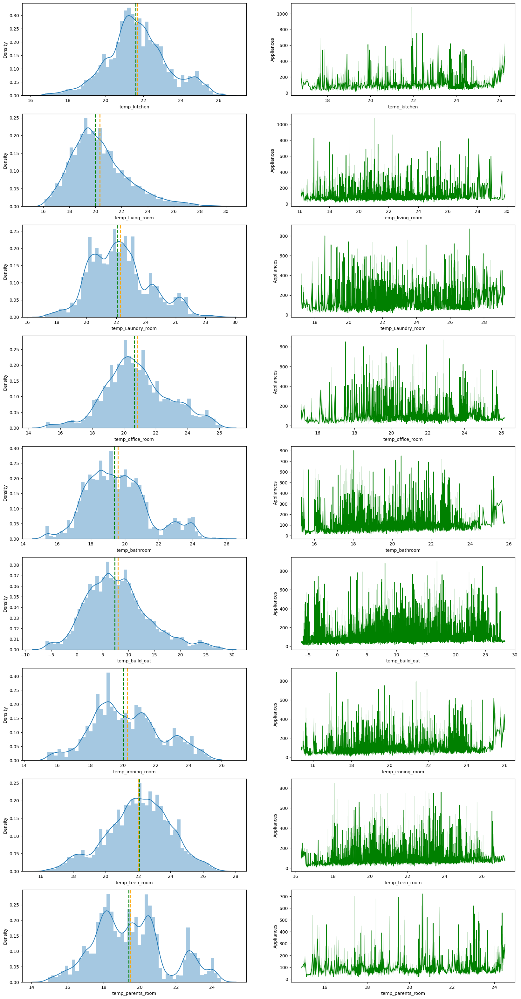

In [170]:
n=len(temp_cols)
fig,ax=plt.subplots(len(temp_cols),2,figsize=(20,40))
for i,col in enumerate(temp_cols):
  #univariate of the columns
  dist=sns.distplot(df_energy[col],ax=ax[i,0])
  ax[i,0].axvline(df_energy[col].mean(), color='orange', linestyle='dashed', linewidth=2)
  ax[i,0].axvline(df_energy[col].median(), color='green', linestyle='dashed', linewidth=2)
  #Bivariate Analysis the Appliance Energy
  #lineplot
  scatter=sns.lineplot(data=df_energy,x=col,y='Appliances',color='green',ax=ax[i,1]);


In [171]:
for col  in temp_cols:
  skewness = df_energy[col].skew(axis=0, skipna = True)
  print("The skweness of temperature columns" ,col ,"is",skewness  )

The skweness of temperature columns temp_kitchen is 0.12091711738520292
The skweness of temperature columns temp_living_room is 0.8896578498994725
The skweness of temperature columns temp_Laundry_room is 0.4507773351008748
The skweness of temperature columns temp_office_room is 0.17038405715992935
The skweness of temperature columns temp_bathroom is 0.5582196988262588
The skweness of temperature columns temp_build_out is 0.5974713395616409
The skweness of temperature columns temp_ironing_room is 0.2547224169425056
The skweness of temperature columns temp_teen_room is -0.25615113577916404
The skweness of temperature columns temp_parents_room is 0.3827112390301909


#### Skewness Number
with the skewness number siginifes that how much it is devatited from the noraml distrubtion
If skewness is less than -1 or greater than 1, the distribution is highly skewed. If skewness is between -1 and -0.5 or between 0.5 and 1, the distribution is moderately skewed. If skewness is between -0.5 and 0.5, the distribution is approximately symmetric.

In our probelm most of the disturbtion follows more likely normal disturbtion with the modreate skewness

When inside building temperatures are below 18 degree celcius energy consumption is minmium means maximum energy can saved. (i.e in some cases only) That is in comparsion with the other temperatuer stats



#### Humidity Columns (UniVarit+Bivariate)


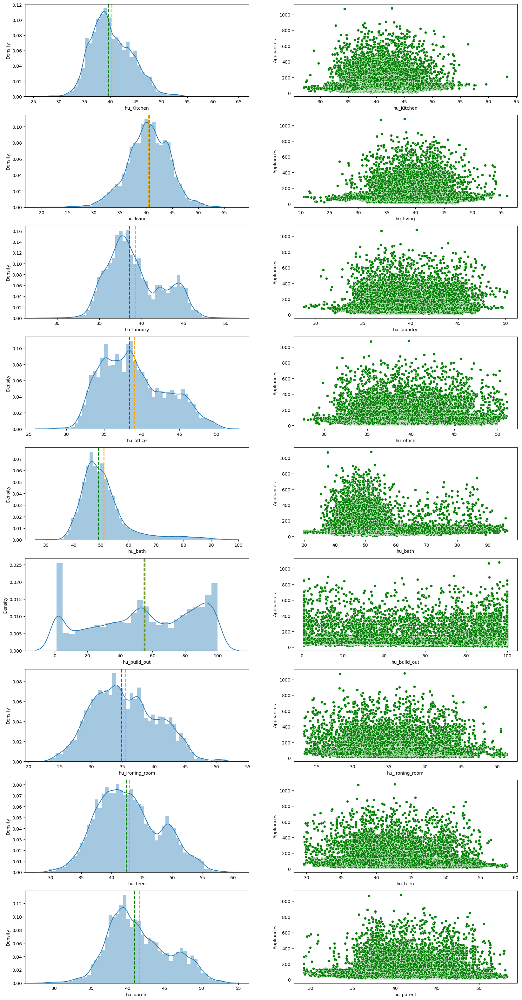

In [172]:
# Chart - 4 visualization code
fig,ax=plt.subplots(len(hu_cols),2,figsize=(20,40))
for i,col in enumerate(hu_cols):
  #univariate of the columns
  dist=sns.distplot(df_energy[col],ax=ax[i,0])
  ax[i,0].axvline(df_energy[col].mean(), color='orange', linestyle='dashed', linewidth=2)
  ax[i,0].axvline(df_energy[col].median(), color='green', linestyle='dashed', linewidth=2)
  #Bivariate Analysis the Appliance Energy Vs Humidity Columns
  #scatter plot
  scatter=sns.scatterplot(data=df_energy,x=col,y='Appliances',color='green',ax=ax[i,1]);
     
     

In [70]:
for col  in hu_cols:
  skewness = df_energy[col].skew(axis=0, skipna = True)
  print("The skweness of temperature columns" ,col ,"is",skewness  )

The skweness of temperature columns hu_Kitchen is 0.46577375642231555
The skweness of temperature columns hu_living is -0.26824717344228066
The skweness of temperature columns hu_laundry is 0.46758907995240717
The skweness of temperature columns hu_office is 0.4446143392062077
The skweness of temperature columns hu_bath is 1.8668200195471256
The skweness of temperature columns hu_build_out is -0.24196120045189282
The skweness of temperature columns hu_ironing_room is 0.24214082895027994
The skweness of temperature columns hu_teen is 0.30803561491175263
The skweness of temperature columns hu_parent is 0.36893704325030624


All humidity distribution is follwed normal distribution except Humidit in bathroom building humidity.

*The living room and bulid out side humdityi is slightly negatively skewed and all the other humdity follows mostly normal disturbtion exceot for the bathroom humdity it is highly postively skewed.
In inside building the mean and median value of humidity distribution lies between 35 to 45 percent,except bathroom humidity and it is near about 50 percent.
For outside building humidity, the mean and median value is around 55 percent.
For inside building low and high humidity causes low consumption of appliances energy. otherwise it causes high spreading data of energy consumption.
For outside building humidity energy consumption data is widely spread irresective of humidity.



#### Weather Columns (UniVarit+Bivariate)


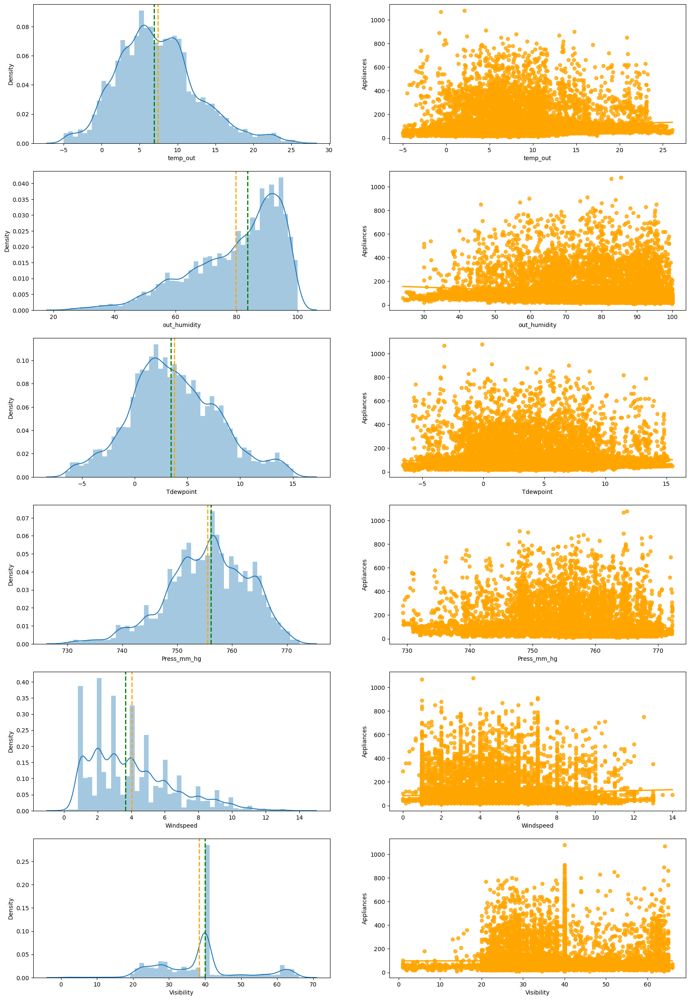

In [173]:
# Chart - 5 visualization code
fig,ax=plt.subplots(len(weather_cols),2,figsize=(20,30))
for i,col in enumerate(weather_cols):
  #univariate of the columns
  dist=sns.distplot(df_energy[col],ax=ax[i,0])
  ax[i,0].axvline(df_energy[col].mean(), color='orange', linestyle='dashed', linewidth=2)
  ax[i,0].axvline(df_energy[col].median(), color='green', linestyle='dashed', linewidth=2)
  #Bivariate Analysis the Appliance Energy Vs weather_cols
  #Scatterplot
  scatter=sns.regplot(data=df_energy,x=col,y='Appliances',color='orange',ax=ax[i,1]);

In [114]:
for col  in weather_cols:
  skewness = df_energy[col].skew(axis=0, skipna = True)
  print("The skweness of " ,col ,"is",skewness  )

The skweness of  temp_out is 0.5342726299233068
The skweness of  out_humidity is -0.9229972472879404
The skweness of  Tdewpoint is 0.23937407657340345
The skweness of  Press_mm_hg is -0.42044151823482934
The skweness of  Windspeed is 0.8599821006227247
The skweness of  Visibility is 0.4415544617776744


1. Temperature outside, Presure,Tdewpoint have followed normal distribution.
2. Windspeed is positively skewd
3. Visibility, outside humidity are negatively skewed.
4. When outside temperature is below 0 degree the spread of the enrgy used data is low. 
5. The mean value of energy used is exceptionally high near -3 and 22 degree celcius

6. When outside humidity is below 40 percent,spread of the energy used data is low and it is near about gradually increase with increase the humidity.The mean value of energy used is exceptionally high near about 30 and 60 percent of humidity.

7. When pressure is below 745 hg,distrbution of energy consumption low,other than it is highly spread.
8. When windspeed is below 1m/s and above 12 m/s the distribution of energy consumption is low.
9. When windspeed is 4 m/s and 9 m/s the mean energy consumption is exceptionally high.



### Histplot representation of nemerical columns

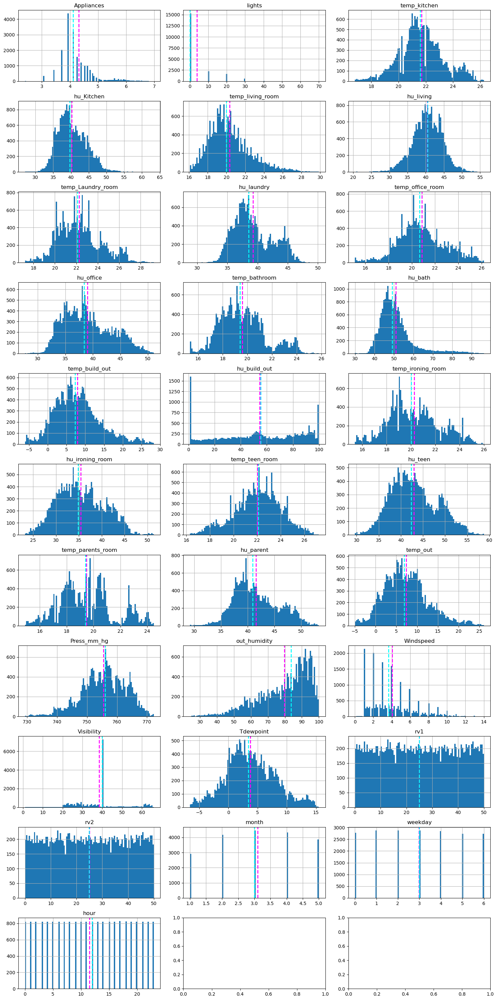

In [110]:
import matplotlib.pyplot as plt

# Determine the number of rows and columns needed for the subplots
n_cols = 3  # Number of columns (you can adjust this based on your preference)
n_rows = (len(df_energy.select_dtypes(include="number").columns) + n_cols - 1) // n_cols  # Calculate number of rows

# Create subplots with a grid layout
fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 30))  # Adjust the figsize as needed

# Flatten the axes to make it easy to iterate over
axes = axes.flatten()

# Loop through numeric columns in the DataFrame
for i, col in enumerate(df_energy.select_dtypes(include="number").columns):
    if col == "MeasureDesc":
        continue
    
    # Select the axis for the current plot
    ax = axes[i]
    
    # Plot the histogram for the column
    feature = df_energy[col]
    feature.hist(bins=100, ax=ax)
    
    # Add vertical lines for mean and median
    ax.axvline(df_energy[col].mean(), color='magenta', linestyle='dashed', linewidth=2)
    ax.axvline(feature.median(), color='cyan', linestyle='dashed', linewidth=2)
    
    # Set the title for the subplot
    ax.set_title(col)

# Adjust layout to make sure plots don't overlap
plt.tight_layout()

# Show all the plots at once
plt.show()

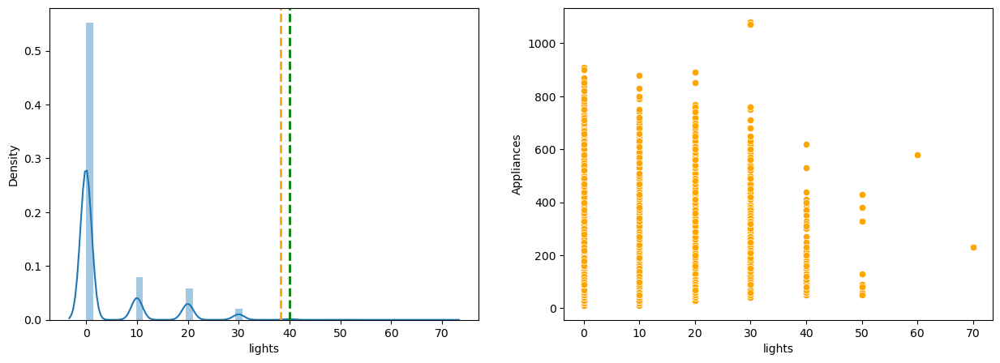

In [175]:
# Chart - 6 visualization code
fig,ax=plt.subplots(1,2,figsize=(15,5))

  #univariate of the columns
dist=sns.distplot(df_energy['lights'],ax=ax[0])
ax[0].axvline(df_energy[col].mean(), color='orange', linestyle='dashed', linewidth=2)
ax[0].axvline(df_energy[col].median(), color='green', linestyle='dashed', linewidth=2)
  #Bivariate Analysis the Appliance Energy
  #lineplot
scatter=sns.scatterplot(data=df_energy,x='lights',y='Appliances',color='orange',ax=ax[1]);


Again, the reason for using distplot is that it provides a quick overview of the skewness, allowing us to decide whether or not to perform the transformation.

A scatterplot is used to plot how much a numerical feature is affected by another numerical value.

This column neither follows the normal distribution nor the relevant skewness.

### Correlation 

### Correlation matrix


In [23]:
# Correlation Heatmap visualization code

correlation = df_energy.corr()
print(correlation)


                   Appliances    lights  temp_kitchen  hu_Kitchen  \
Appliances           1.000000  0.197278      0.055447    0.086031   
lights               0.197278  1.000000     -0.023528    0.106968   
temp_kitchen         0.055447 -0.023528      1.000000    0.164006   
hu_Kitchen           0.086031  0.106968      0.164006    1.000000   
temp_living_room     0.120073 -0.005622      0.836834    0.269839   
hu_living           -0.060465  0.050985     -0.002509    0.797535   
temp_Laundry_room    0.085060 -0.097393      0.892402    0.253230   
hu_laundry           0.036292  0.131161     -0.028550    0.844677   
temp_office_room     0.040281 -0.008859      0.877001    0.106180   
hu_office            0.016965  0.114936      0.097861    0.880359   
temp_bathroom        0.019760 -0.078745      0.885247    0.205797   
hu_bath              0.006955  0.141233     -0.014782    0.303258   
temp_build_out       0.117638 -0.079029      0.654769    0.316141   
hu_build_out        -0.083178  0.1

#### Heatmap

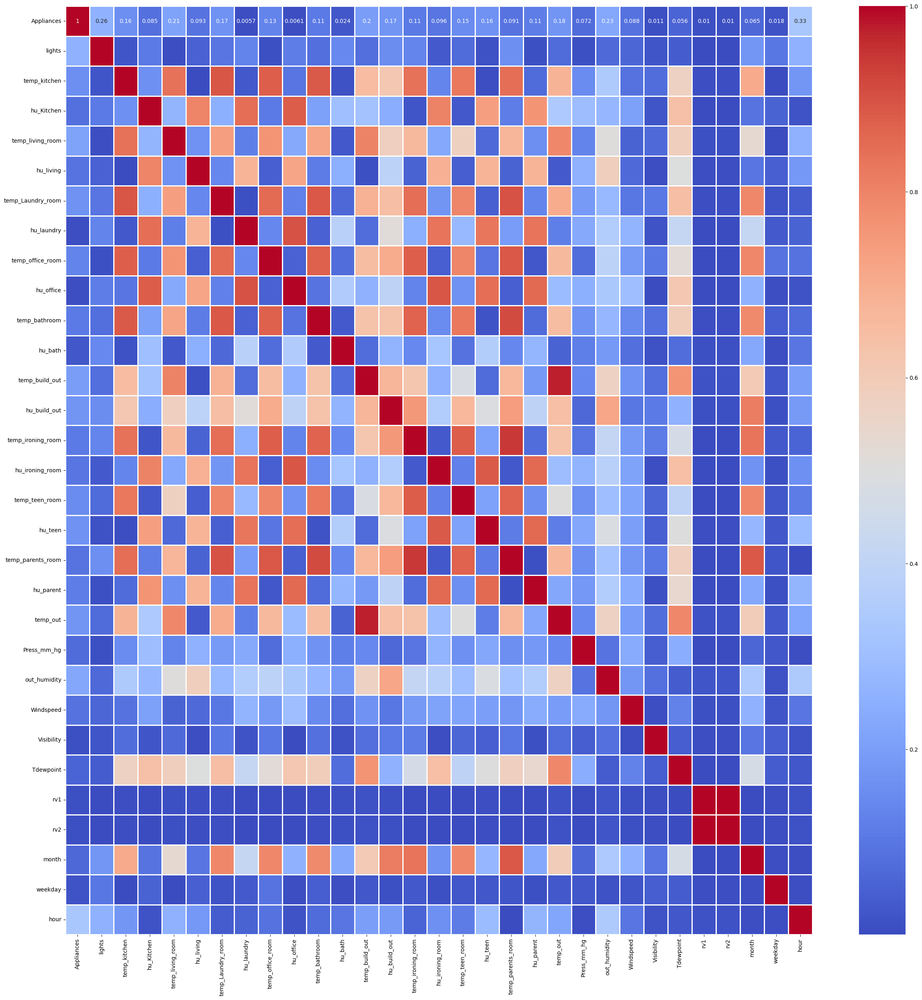

In [125]:

plt.figure(figsize=(30,30))
sns.heatmap(abs(correlation) ,annot =True , cmap = 'coolwarm', linewidth = 1)
plt.show()

allows us to determine which features to keep and which to eliminate or combine.

Temprature columns : It is clear from the heatmap that four columns have a high degree of correlation with parent_room_temperature that are temp_Laundry_room,temp_bathroom,temp_ironing_room,temp_teen_room also temp_build_out & temp_out has high correlation. Hence temp_build_out & temp_parents_room is to be removed from training set as information provided by them can be provided by other features.
Humidity columns : For each and every humidity columns, we see moderate correlation.
Weather_columns: Visibility, Tdewpoint, Press_mm_hg have low correlation values
Random variables column : Similar to the trend that we have seen in the weather columns we have low correlations

### Correlation of Temperature columns with appliences

In [128]:

for col in temp_cols[:]:
  feature = df_energy[col]
  label = df_energy['Appliances']
  correaltion = feature.corr(label)
  print('the colreation of',col ,'with Appliances is',correaltion)
     

the colreation of temp_kitchen with Appliances is 0.15937809579424328
the colreation of temp_living_room with Appliances is 0.21378409410408683
the colreation of temp_Laundry_room with Appliances is 0.16615696341222405
the colreation of temp_office_room with Appliances is 0.13105796436472075
the colreation of temp_bathroom with Appliances is 0.10880336338714634
the colreation of temp_build_out with Appliances is 0.19582140514057156
the colreation of temp_ironing_room with Appliances is 0.10917445755202625
the colreation of temp_teen_room with Appliances is 0.1523676632245162
the colreation of temp_parents_room with Appliances is 0.09128380370794485


The corelation value states that the all tempereature columns are less correalted with appiances and has not much siginfically linearly correaltion with each other
Althuough the tempreature columns are highy correlated with each other,that may leads to multicollineratity need to take care of in model analysis

### Correlation of weather columns with appliences

In [130]:
for col in weather_cols[:]:
  feature = df_energy[col]
  label = df_energy['Appliances']
  correaltion = feature.corr(label)
  print('The corealtion of',col,'with the Appliances is ', correaltion)
          

The corealtion of temp_out with the Appliances is  0.1754211655072579
The corealtion of out_humidity with the Appliances is  -0.22568973157329908
The corealtion of Tdewpoint with the Appliances is  0.05570016342888975
The corealtion of Press_mm_hg with the Appliances is  -0.07217285780734838
The corealtion of Windspeed with the Appliances is  0.08804571151787281
The corealtion of Visibility with the Appliances is  -0.010853839346299332


### Appliences energy distribution

<Axes: xlabel='hour', ylabel='Appliances'>

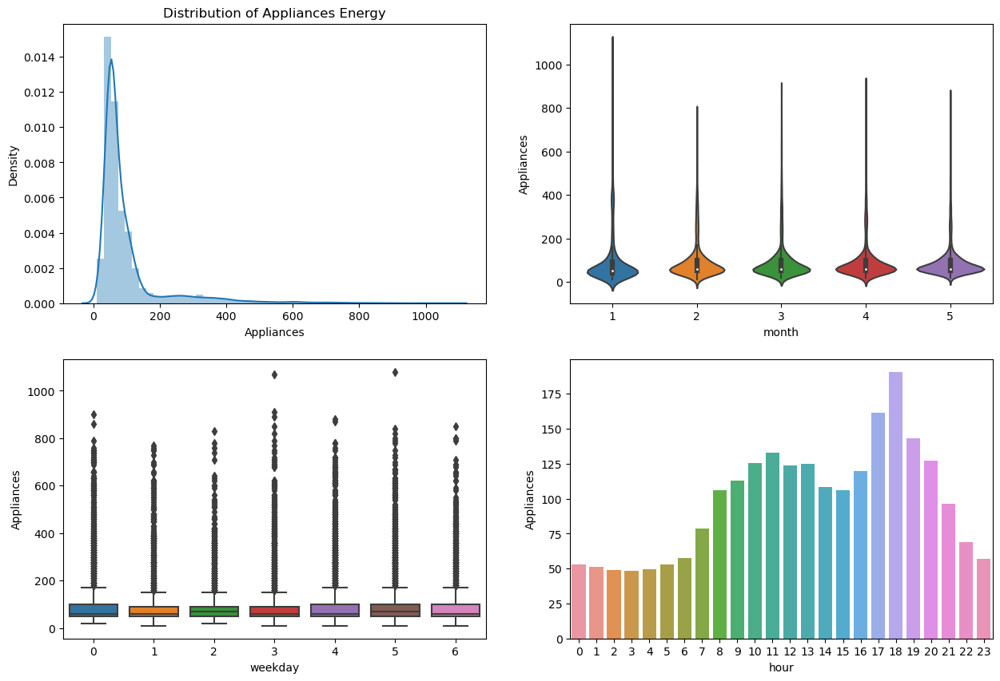

In [24]:
fig,ax=plt.subplots(2,2,figsize=(15,10))

#Distribution of Appliances
dist=sns.distplot(df_energy['Appliances'],ax=ax[0,0])
dist.set_title('Distribution of Appliances Energy')

#Average Appliances Energy over month
month_eng=pd.DataFrame(df_energy.groupby('month')['Appliances'].mean()).reset_index()
sns.violinplot(x=df_energy['month'],y=df_energy['Appliances'], ax=ax[0,1])

#Average Appliances Energy over weekdays
weekday_eng=pd.DataFrame(df_energy.groupby('weekday')['Appliances'].mean()).reset_index()
#sns.barplot(x=weekday_eng['weekday'],y=weekday_eng['Appliances'],ax=ax[1,0])
sns.boxplot(x=df_energy['weekday'],y=df_energy['Appliances'],ax=ax[1,0])
#Average Appliances Energy over hours
hour_eng=pd.DataFrame(df_energy.groupby('hour')['Appliances'].mean()).reset_index()
sns.barplot(x=hour_eng['hour'],y=hour_eng['Appliances'],ax=ax[1,1])

Appliances Enegry has positive skewness. A log transformation can make it normal. Most of the values are around 100 Wh. Outliers are also present in the column.

In the month of January, the energy usage is high compared to the other months, and February has low energy consumption.

In the hours of the day, 8 hrs to 21 hrs have high energy consumption.

#### Pair Plot visualization code

<Figure size 640x480 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

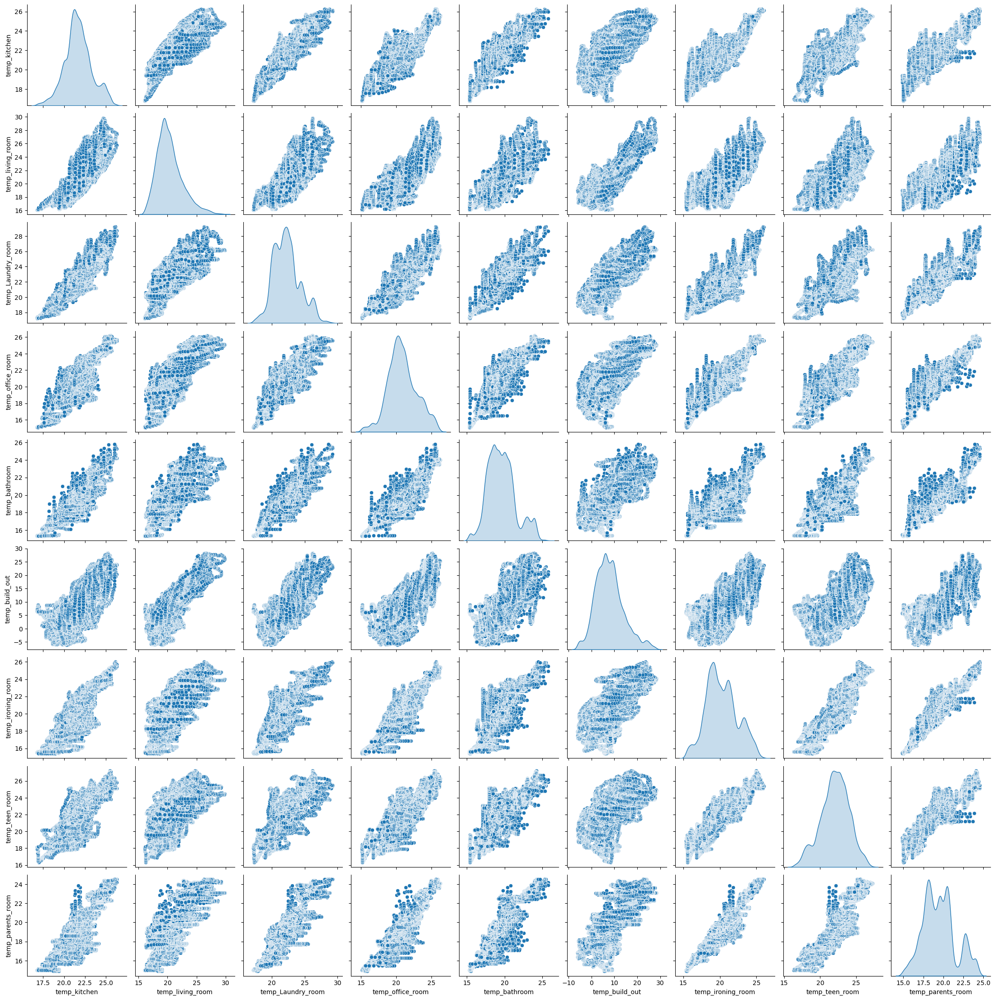

In [141]:
# Temperature Columns
# Add a title
plt.suptitle("Pair Plot of Temperature Columns", y=1.02) 
plt.figure(figsize=(25,25))
pair=sns.pairplot(df_energy[temp_cols], diag_kind='kde')
plt.show()

pair plot is a data visualisation that plots pair-wise relationships between all the variables in a dataset. This helps to better understand the relationships visually.


All Temperature has linear relationship with each other
'temperature of parents_room' with laundry room,bathroom,ironing room,teen room temperature has strong linear relationship.

<Figure size 2500x2500 with 0 Axes>

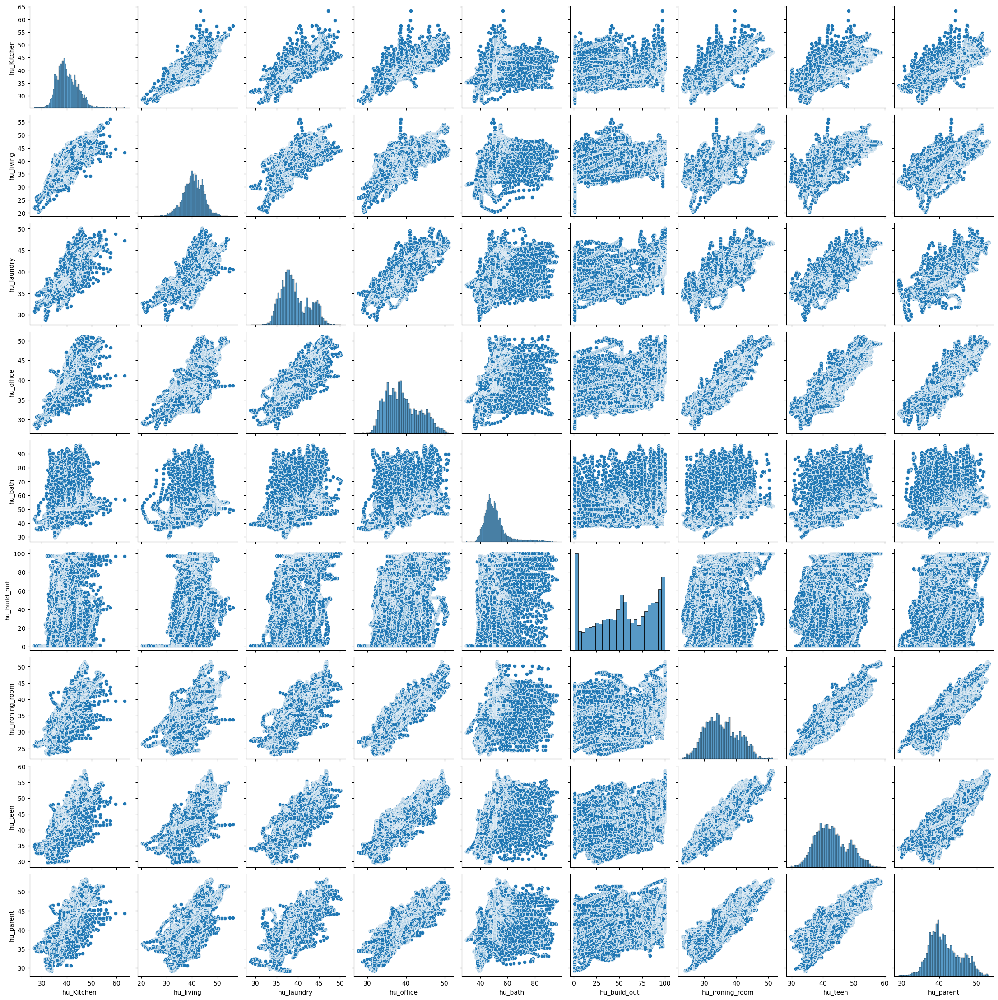

In [147]:
# Humidity Columns
# Add a title
plt.figure(figsize=(25,25))
pair=sns.pairplot(df_energy[hu_cols], diag_kind='hist')
plt.show()

All humidity columns have linear relationship with each other except outside building humidity and bathroom relationship.
Humidity columns may be lead to multicolinearity.

<Figure size 2500x2500 with 0 Axes>

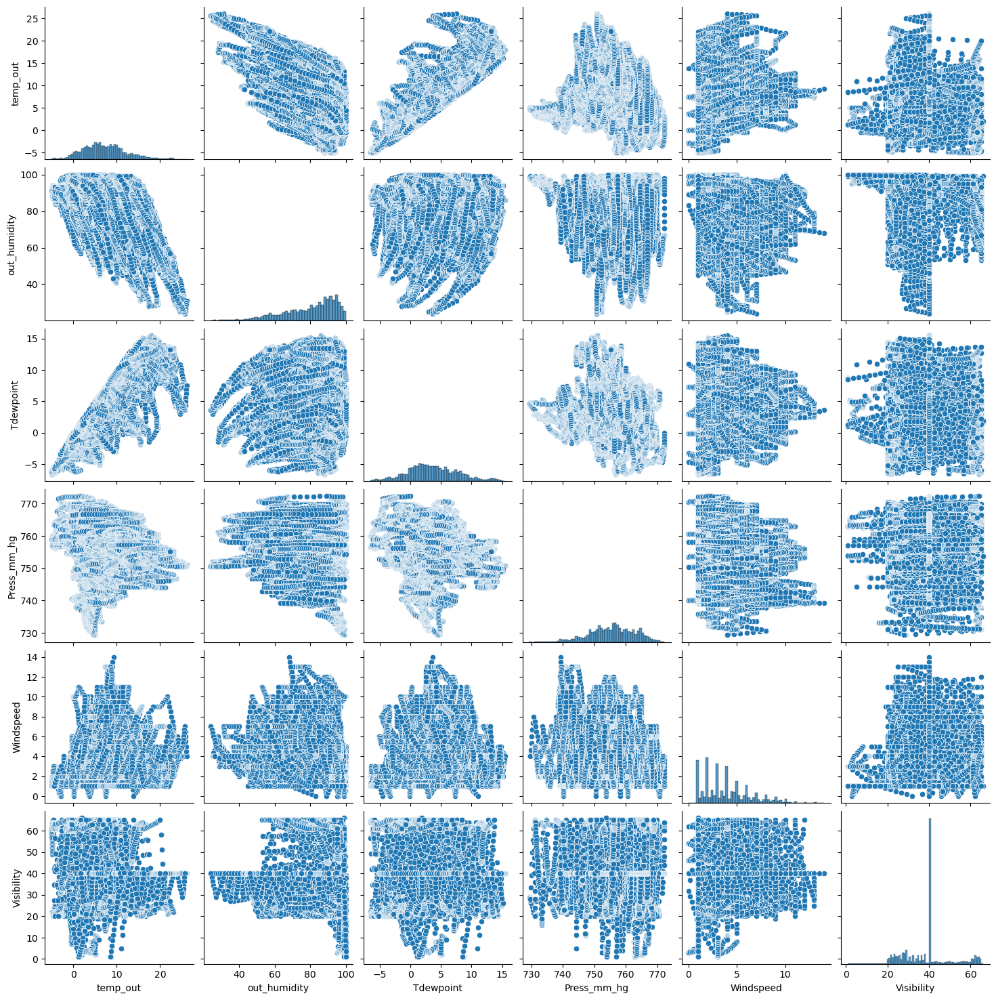

In [142]:
# Weather Columns

plt.figure(figsize=(25,25))
pair=sns.pairplot(df_energy[weather_cols], diag_kind='hist')
plt.show()
     

Temperature and Humidity has negative linear relationship.
Temperature and Tdewpoint has positive linear relationship.


## Handling Outliers & Outlier treatments

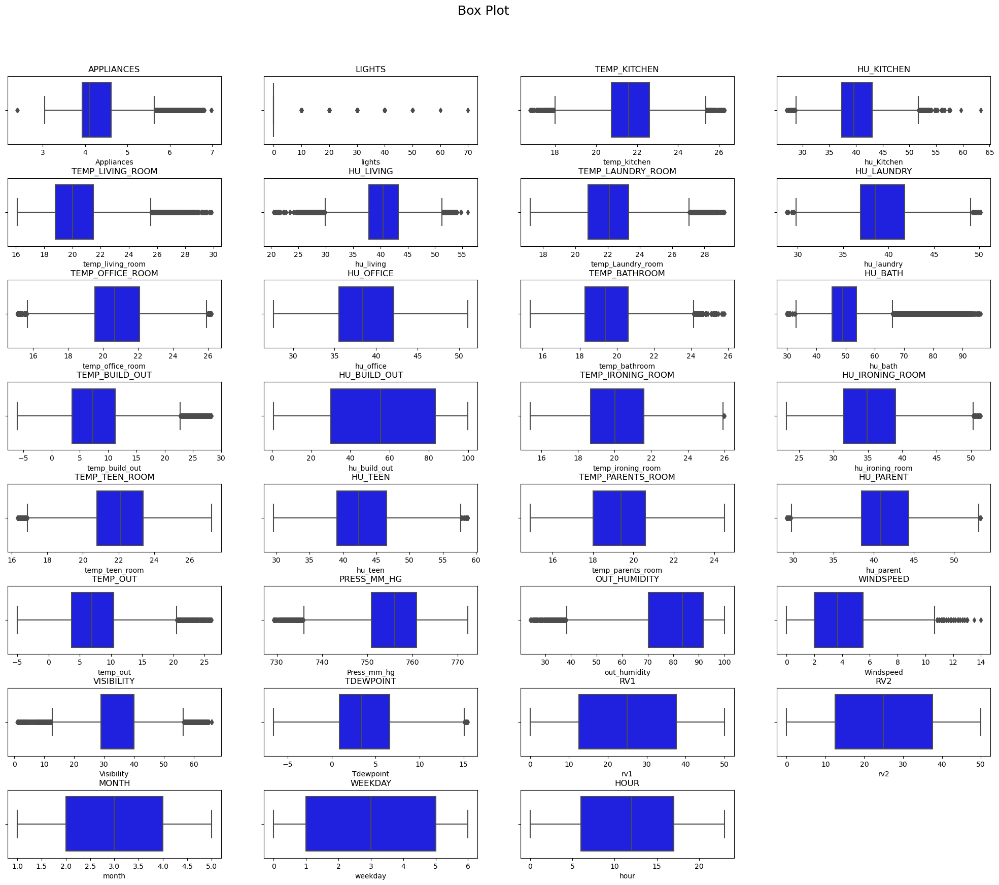

In [48]:
# Handling Outliers & Outlier treatments
df= df_energy.copy()
col_list = list(df.describe().columns)

#find the outliers using boxplot
plt.figure(figsize=(25, 20))
plt.suptitle("Box Plot", fontsize=18, y=0.95)

for n, ticker in enumerate(col_list):

    ax = plt.subplot(8, 4, n + 1)

    plt.subplots_adjust(hspace=0.5, wspace=0.2)

    sns.boxplot(x=df[ticker],color='blue', ax = ax)

    # chart formatting
    ax.set_title(ticker.upper())


In [50]:
def find_outliers_iqr(data):
    # Calculate the first quartile (Q1) and third quartile (Q3) for each column
    q1 = data.quantile(0.25)
    q3 = data.quantile(0.75)

    # Calculate the interquartile range (IQR) for each column
    iqr = q3 - q1

    # Calculate the lower and upper bounds for outliers for each column
    lower_bound = q1 - 1.5 * iqr
    upper_bound = q3 + 1.5 * iqr

    # Check for outliers in each column and count the number of outliers
    outliers_count = (data < lower_bound) | (data > upper_bound)
    num_outliers = outliers_count.sum()

    return num_outliers


outliers_per_column = find_outliers_iqr(df)
print("Number of outliers per column:")
print(outliers_per_column.sort_values(ascending = False))


Number of outliers per column:
lights               4483
Visibility           2522
hu_bath              1330
Appliances           1282
temp_living_room      546
temp_kitchen          515
temp_build_out        515
temp_out              436
out_humidity          239
hu_living             235
Press_mm_hg           219
temp_Laundry_room     217
Windspeed             214
temp_office_room      186
temp_bathroom         179
hu_Kitchen            146
temp_teen_room         71
hu_ironing_room        42
hu_parent              21
hu_teen                17
hu_laundry             15
Tdewpoint              10
temp_ironing_room       2
temp_parents_room       0
hu_build_out            0
hu_office               0
rv1                     0
rv2                     0
month                   0
weekday                 0
hour                    0
dtype: int64


*   Here three columns have highest outliers applaincec, lights,hu_bathroom,visibility and other have outliers too byt less compared to the top 4



In [54]:
# Handling Outliers & Outlier treatments
print(col_list)
for ftr in col_list:
  print(ftr,'\n')
  q_25= np.percentile(df[ftr], 25)
  q_75 = np.percentile(df[ftr], 75)
  iqr = q_75 - q_25
  print('Percentiles: 25th=%.3f, 75th=%.3f, IQR=%.3f' % (q_25, q_75, iqr))
  # calculate the outlier cutoff
  cut_off = iqr * 1.5
  lower = q_25 - cut_off
  upper = q_75 + cut_off
  print(f"\nlower = {lower} and upper = {upper} \n ")
  # identify outliers
  outliers = [x for x in df[ftr] if x < lower or x > upper]
  print('Identified outliers: %d' % len(outliers))
  
  #removing outliers
  
  if len(outliers)!=0:

    def bin(row):
      if row[ftr]> upper:
        return upper
      if row[ftr] < lower:
        return lower
      else:
        return row[ftr]



    df[ftr] =  df.apply (lambda row: bin(row), axis=1)
    print(f"{ftr} Outliers Removed")
  print("\n-------\n")
     


['Appliances', 'lights', 'temp_kitchen', 'hu_Kitchen', 'temp_living_room', 'hu_living', 'temp_Laundry_room', 'hu_laundry', 'temp_office_room', 'hu_office', 'temp_bathroom', 'hu_bath', 'temp_build_out', 'hu_build_out', 'temp_ironing_room', 'hu_ironing_room', 'temp_teen_room', 'hu_teen', 'temp_parents_room', 'hu_parent', 'temp_out', 'Press_mm_hg', 'out_humidity', 'Windspeed', 'Visibility', 'Tdewpoint', 'rv1', 'rv2', 'month', 'weekday', 'hour']
Appliances 

Percentiles: 25th=3.932, 75th=4.615, IQR=0.683

lower = 2.9068833065489246 and upper = 5.64006284301666 
 
Identified outliers: 0

-------

lights 

Percentiles: 25th=0.000, 75th=0.000, IQR=0.000

lower = 0.0 and upper = 0.0 
 
Identified outliers: 0

-------

temp_kitchen 

Percentiles: 25th=20.760, 75th=22.600, IQR=1.840

lower = 18.0 and upper = 25.36 
 
Identified outliers: 0

-------

hu_Kitchen 

Percentiles: 25th=37.333, 75th=43.067, IQR=5.733

lower = 28.733333333333185 and upper = 51.666666666666806 
 
Identified outliers: 0



### The code does not remove outliers completely;
it replaces outlier values with the upper or lower bounds determined by the IQR.
This is a form of outlier treatment, where extreme values are "capped" 

#### Boxplot after treating outliers

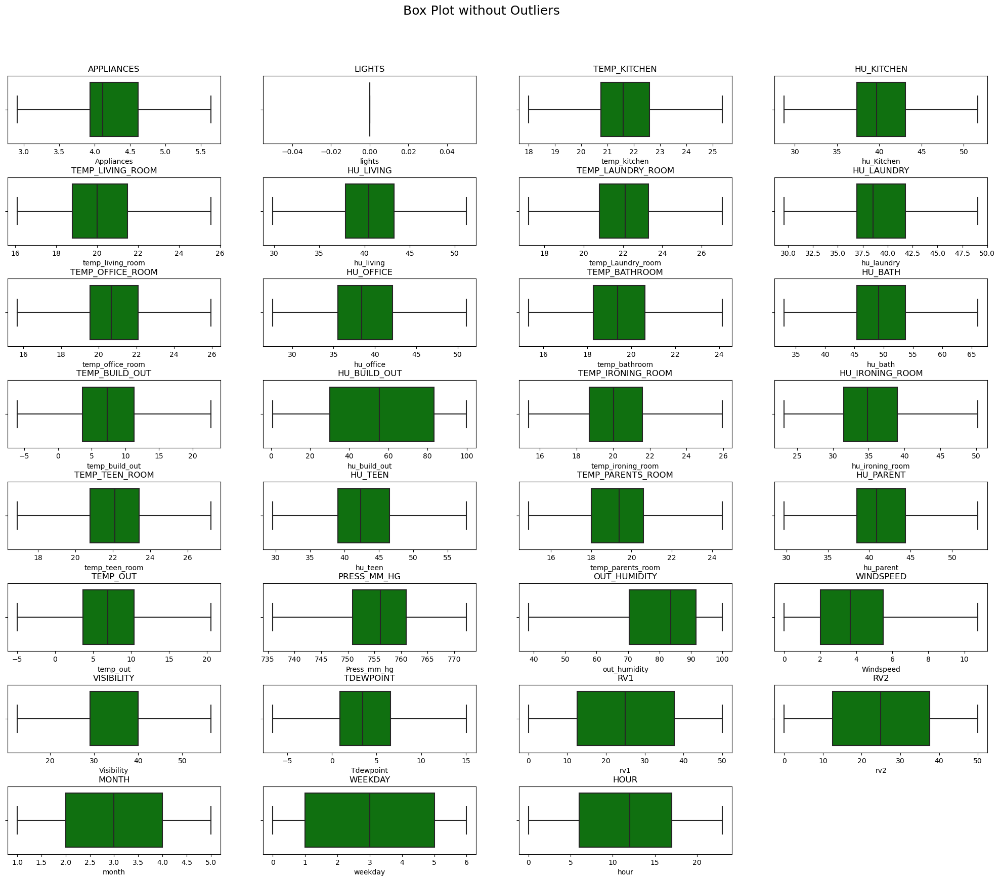

In [53]:
plt.figure(figsize=(25, 20))
plt.suptitle("Box Plot without Outliers", fontsize=18, y=0.95)
#plot the all figures in loop with boxplot
for n, ticker in enumerate(col_list):

    ax = plt.subplot(8, 4, n + 1)

    plt.subplots_adjust(hspace=0.5, wspace=0.2)

    sns.boxplot(x=df[ticker],color='g' ,ax = ax)

    # chart formatting
    ax.set_title(ticker.upper())


Outliers are successfully treated.

In [63]:
### After Removing outliers
df.describe()

,Appliances,lights,temp_kitchen,hu_Kitchen,temp_living_room,hu_living,temp_Laundry_room,hu_laundry,temp_office_room,hu_office,...,Press_mm_hg,out_humidity,Windspeed,Visibility,Tdewpoint,rv1,rv2,month,weekday,hour
count,19735.000000,19735.0,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,...,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000
mean,4.295180,0.0,21.689928,40.249990,20.307042,40.438762,22.259048,39.242344,20.857620,39.026904,...,755.553294,79.816249,4.030209,37.745520,3.760621,24.988033,24.988033,3.101647,2.977249,11.502002
std,0.583304,0.0,1.580210,3.942554,2.093877,3.982628,1.982974,3.253254,2.035499,4.341321,...,7.309428,14.698986,2.421942,10.419724,4.194413,14.496634,14.496634,1.339200,1.985617,6.921953
min,2.906883,0.0,18.000000,28.733333,16.100000,29.860000,17.200000,29.610000,15.675000,27.660000,...,735.933333,38.333333,0.000000,12.500000,-6.600000,0.005322,0.005322,1.000000,0.000000,0.000000
25%,3.931826,0.0,20.760000,37.333333,18.790000,37.900000,20.790000,36.900000,19.530000,35.530000,...,750.933333,70.333333,2.000000,29.000000,0.900000,12.497889,12.497889,2.000000,1.000000,6.000000
50%,4.110874,0.0,21.600000,39.656667,20.000000,40.500000,22.100000,38.530000,20.666667,38.400000,...,756.100000,83.666667,3.666667,40.000000,3.433333,24.897653,24.897653,3.000000,3.000000,12.000000
75%,4.615121,0.0,22.600000,43.066667,21.500000,43.260000,23.290000,41.760000,22.100000,42.156667,...,760.933333,91.666667,5.500000,40.000000,6.566667,37.583769,37.583769,4.000000,5.000000,17.000000
max,5.640063,0.0,25.360000,51.666667,25.565000,51.300000,27.040000,49.050000,25.955000,51.090000,...,772.300000,100.000000,10.750000,56.500000,15.066667,49.996530,49.996530,5.000000,6.000000,23.000000


In [65]:
df.shape

(19735, 31)

###  Categorical Encoding

In [67]:
# Info about the columns
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 19735 entries, 0 to 19734
Data columns (total 31 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   Appliances         19735 non-null  float64
 1   lights             19735 non-null  float64
 2   temp_kitchen       19735 non-null  float64
 3   hu_Kitchen         19735 non-null  float64
 4   temp_living_room   19735 non-null  float64
 5   hu_living          19735 non-null  float64
 6   temp_Laundry_room  19735 non-null  float64
 7   hu_laundry         19735 non-null  float64
 8   temp_office_room   19735 non-null  float64
 9   hu_office          19735 non-null  float64
 10  temp_bathroom      19735 non-null  float64
 11  hu_bath            19735 non-null  float64
 12  temp_build_out     19735 non-null  float64
 13  hu_build_out       19735 non-null  float64
 14  temp_ironing_room  19735 non-null  float64
 15  hu_ironing_room    19735 non-null  float64
 16  temp_teen_room     197

Numerical encoding is the process of converting categorical data (non-numeric values) into numerical form so that it can be used in statistical and machine learning models. Machine learning models often work only with numerical data, so encoding is essential for categorical features. 

Here are common types of numerical encoding methods:

1. Label Encoding
    Each unique category value is assigned an integer value.
2. One-Hot Encoding
    Creates a new binary column for each unique category value, with 1 indicating the presence of the category and 0 otherwise.
3. Ordinal Encoding
    Assigns an integer value to categories based on a defined order. Useful for ordinal categories where order matters.
4. Target Encoding (Mean Encoding)
    Replaces each category with the mean of the target variable for that category.
5. Frequency Encoding
    Each category is replaced by the frequency (or count) of its occurrence in the dataset.
6. Binary Encoding
    Combines properties of one-hot and label encoding by converting categories to binary and then splitting each binary digit into a separate column.
    
    In summary, one-hot encoding is generally the default choice for low-cardinality, non-ordinal categorical data, while target encoding and frequency encoding are valuable for high-cardinality features, especially with tree-based models.

Here all the columns are numerical values. so no need to encode the data.  

In [68]:
from sklearn.decomposition import PCA

pca = PCA(n_components=2)  # Set the number of principal components to keep
df_reduced = pca.fit_transform(df)

In [71]:
df_reduced.shape

(19735, 2)

In [75]:
df_reduced.shape

(19735, 2)

## Feature Selection Usin Select K best

In [91]:
from sklearn.feature_selection import SelectKBest, f_regression


# Separate features and target variable
X = df.drop(columns=['Appliances'])  # assuming 'Appliances' is the target column
y = df['Appliances']

# Select top k features
k = 10  # specify the number of top features you want to select
selector = SelectKBest(score_func=f_regression, k=k)
X_selected = selector.fit_transform(X, y)

# Get the column names of the selected features
selected_features = X.columns[selector.get_support()]

# Display selected feature names and their scores
feature_scores = selector.scores_[selector.get_support()]
selected_features_scores = pd.DataFrame({
    'Feature': selected_features,
    'Score': feature_scores
}).sort_values(by='Score', ascending=False)

print("Selected Features and their scores:\n", selected_features_scores)

X=selected_features_scores


Selected Features and their scores:
              Feature        Score
9               hour  2812.011122
8       out_humidity  1215.449604
1   temp_living_room  1132.143995
3     temp_build_out   925.471076
7           temp_out   742.610486
4       hu_build_out   733.514243
0       temp_kitchen   658.288067
6            hu_teen   644.578374
2  temp_Laundry_room   639.444934
5     temp_teen_room   614.094916


In [98]:
# Assuming 'Appliances' is your target variable
X = df.drop(columns=['Appliances'])  # Features (should have 19735 rows)
y = df['Appliances']  # Target (should have 19735 rows)

# Verify the shapes
print(X.shape)  # Should show (19735, n_features)
print(y.shape)  # Should show (19735,)

# Align X and y by ensuring they both contain data for the same 19735 rows
df = df.dropna(subset=['Appliances'])  # Drop rows with missing target values

X = df.drop(columns=['Appliances'])  # Features
y = df['Appliances']  # Target


(19735, 30)
(19735,)


In [99]:
print(df.shape) 
print(X.shape)  # Check the shape of features
print(y.shape)  # Check the shape of target variable


(19735, 31)
(19735, 30)
(19735,)


## Splitting the data set into test data and train data

In [106]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)



## Scaling the training data Using standard scaler 

In [113]:
from sklearn.preprocessing import StandardScaler

# Initialize the scaler
scaler = StandardScaler()

# Fit the scaler on the training data and transform it
X_train_scaled = scaler.fit_transform(X_train)

# If you want to scale the test data using the same scaler (without fitting it again)
X_test_scaled = scaler.transform(X_test)

print("X_train_scaled\n",X_train_scaled,"\nX_test_scaled\n",X_test_scaled)

# Now X_train_scaled and X_test_scaled are ready for modeling

X_train_scaled
 [[ 0.         -1.1380668   1.33493904 ... -1.56529632 -1.00044522
   0.07244635]
 [ 0.          2.31655107  1.60489989 ...  1.4130584   0.50925903
   0.79389388]
 [ 0.          0.51029748  1.06243139 ... -0.82070764 -0.49721047
   0.21673585]
 ...
 [ 0.         -0.88544392 -1.16092539 ... -0.82070764  0.00602428
  -1.22615921]
 [ 0.          0.06189187 -1.1965806  ... -1.56529632  1.51572854
   0.64960437]
 [ 0.         -0.23283482 -0.6439249  ...  0.66846972  1.01249379
  -0.36042217]] 
X_test_scaled
 [[ 0.         -0.5065096  -1.23732941 ... -0.07611896 -1.50367997
  -1.51473822]
 [ 0.          0.12504759  2.90546598 ... -1.56529632  1.01249379
   1.22676239]
 [ 0.         -0.190731   -1.2118614  ... -0.07611896 -1.00044522
  -1.22615921]
 ...
 [ 0.          0.12504759 -0.96651963 ...  0.66846972 -1.50367997
   0.21673585]
 [ 0.          1.8365676   1.85193953 ...  1.4130584  -0.49721047
  -0.9375802 ]
 [ 0.          2.31655107  1.77553552 ...  1.4130584   0.00602428


# PCA for dimensionality reduction:

If you decide to proceed with PCA for dimensionality reduction, here’s how you can implement it:



In [111]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import pandas as pd

# Assuming you have X_train_scaled and X_test_scaled ready after scaling

# Initialize PCA (you can adjust n_components based on how much variance you want to retain)
pca = PCA(n_components=0.95)  # Retain 95% of the variance
X_train_pca = pca.fit_transform(X_train_scaled)
X_test_pca = pca.transform(X_test_scaled)

# Display the number of components after reduction
print("Original number of features:", X_train_scaled.shape[1])
print("Reduced number of features:", X_train_pca.shape[1])

# Optional: Check the explained variance ratio for each principal component
print("Explained variance ratio:", pca.explained_variance_ratio_)

Original number of features: 30
Reduced number of features: 12
Explained variance ratio: [0.34720042 0.24966642 0.0707375  0.06809286 0.03803378 0.03711709
 0.03429684 0.03321647 0.02653786 0.01922868 0.01786016 0.0127742 ]


## ML Model Implementation